In [2]:
import numpy as np
import pandas as pd
import scipy
import pickle
import random
import os

# loading in and transforming data
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torchvision.utils import make_grid
import PIL
from PIL import Image
import imageio
from torchvision.datasets import ImageFolder as IF
from torchsummary import summary

# visualizing data
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [ ]:
!pip install numpy
!pip install torch
!pip install pandas
!pip install scipy


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 33.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 56.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 52.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 14.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 5.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 100.8 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitli

In [3]:
path_monet = '/content/drive/MyDrive/Dataset/trainA'
path_photo = '/content/drive/MyDrive/Dataset/trainB'
img_size = 256

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
def set_seed(seed):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True


set_seed(42)

In [5]:
def save_checkpoint(iteration, G_XtoY, G_YtoX, D_X, D_Y, checkpoint_dir='/content'):
    """
    Saves the parameters of both generators and discriminators.
    """
    #Path
    G_XtoY_path = os.path.join(checkpoint_dir, 'G_XtoY.pkl')
    G_YtoX_path = os.path.join(checkpoint_dir, 'G_YtoX.pkl')
    D_X_path = os.path.join(checkpoint_dir, 'D_X.pkl')
    D_Y_path = os.path.join(checkpoint_dir, 'D_Y.pkl')
    #Saving
    torch.save(G_XtoY.state_dict(), G_XtoY_path)
    torch.save(G_YtoX.state_dict(), G_YtoX_path)
    torch.save(D_X.state_dict(), D_X_path)
    torch.save(D_Y.state_dict(), D_Y_path)



In [6]:
def load_checkpoint(checkpoint_path, map_location=None):
    """
    Load checkoint
    """
    #model.load_state_dict(torch.load(checkpoint_path))
    checkpoint = torch.load(checkpoint_path, map_location=map_location)
    print(' [*] Loading checkpoint from %s succeed!' % checkpoint_path)
    return checkpoint


In [7]:
transforms.Compose([
    transforms.Resize((128, 128)),  # instead of (256, 256) or larger
    transforms.ToTensor(),
    transforms.Normalize((0.5,), (0.5,))  # Normalize if needed
])


Compose(
    Resize(size=(128, 128), interpolation=bilinear, max_size=None, antialias=True)
    ToTensor()
    Normalize(mean=(0.5,), std=(0.5,))
)

In [8]:
def reverse_normalize(image, mean_=0.5, std_=0.5):
    if torch.is_tensor(image):
        image = image.detach().numpy()
    un_normalized_img = image * std_ + mean_
    un_normalized_img = un_normalized_img * 255
    return np.uint8(un_normalized_img)


In [9]:

def show_test(fixed_Y, fixed_X, G_YtoX, G_XtoY, mean_=0.5, std_=0.5):
    """
    Shows results of generates based on test image input.
    """
    #Identify correct device
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    #Create fake pictures for both cycles
    fake_X = G_YtoX(fixed_Y.to(device))
    fake_Y = G_XtoY(fixed_X.to(device))

    #Generate grids
    grid_x =  make_grid(fixed_X, nrow=4).permute(1, 2, 0).detach().cpu().numpy()
    grid_y =  make_grid(fixed_Y, nrow=4).permute(1, 2, 0).detach().cpu().numpy()
    grid_fake_x =  make_grid(fake_X, nrow=4).permute(1, 2, 0).detach().cpu().numpy()
    grid_fake_y =  make_grid(fake_Y, nrow=4).permute(1, 2, 0).detach().cpu().numpy()

    #Normalize pictures to pixel range rom 0 to 255
    X, fake_X = reverse_normalize(grid_x, mean_, std_), reverse_normalize(grid_fake_x, mean_, std_)
    Y, fake_Y = reverse_normalize(grid_y, mean_, std_), reverse_normalize(grid_fake_y, mean_, std_)

    #Transformation from X -> Y
    fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, sharey=True, figsize=(20, 10))
    ax1.imshow(X)
    ax1.axis('off')
    ax1.set_title('X')
    ax2.imshow(fake_Y)
    ax2.axis('off')
    ax2.set_title('Fake Y  (Monet-esque)')
    plt.show()

In [10]:

# Here image size is 256*256

class ImageDataset(Dataset):
        """
        Custom dataset
        """

        def __init__(self, img_path, img_size=256, normalize=True):
            self.img_path = img_path

            if normalize:
                self.transform = transforms.Compose([
                    transforms.Resize(img_size),
                    transforms.ToTensor(),
                    transforms.Normalize(mean=[0.5], std=[0.5])
                ])
            else:
                self.transform = transforms.Compose([
                    transforms.Resize(img_size),
                    transforms.ToTensor()
                ])

            #Dictionary entries
            self.img_idx = dict()
            for number_, img_ in enumerate(os.listdir(self.img_path)):
                self.img_idx[number_] = img_

        def __len__(self):
            #Length of dataset --> number of images
            return len(self.img_idx)

        def __getitem__(self, idx):
            img_path = os.path.join(self.img_path, self.img_idx[idx])
            img = Image.open(img_path)
            img = self.transform(img)

            return img



In [11]:
#Create datasets
dataset_monet = ImageDataset(path_monet, img_size=256, normalize=True) #monet
dataset_photo = ImageDataset(path_photo, img_size=256, normalize=True) #photo

In [12]:
DataLoader(dataset_monet, batch_size=5, shuffle=True, num_workers=2, pin_memory=True)
DataLoader(dataset_photo, batch_size=5, shuffle=True, num_workers=2, pin_memory=True)



In [13]:

#Create test loaders
batch_size_test = 8
batch_size=16
test_dataloader_Y = DataLoader(dataset_monet, batch_size=batch_size_test, shuffle=False, num_workers=0, pin_memory=True)
test_dataloader_X = DataLoader(dataset_photo, batch_size=batch_size_test, shuffle=False, num_workers=0, pin_memory=True)
dataloader_Y = DataLoader(dataset_monet, batch_size=batch_size, shuffle=True, num_workers=0, pin_memory=True)
dataloader_X = DataLoader(dataset_photo, batch_size=batch_size, shuffle=True, num_workers=0, pin_memory=True)



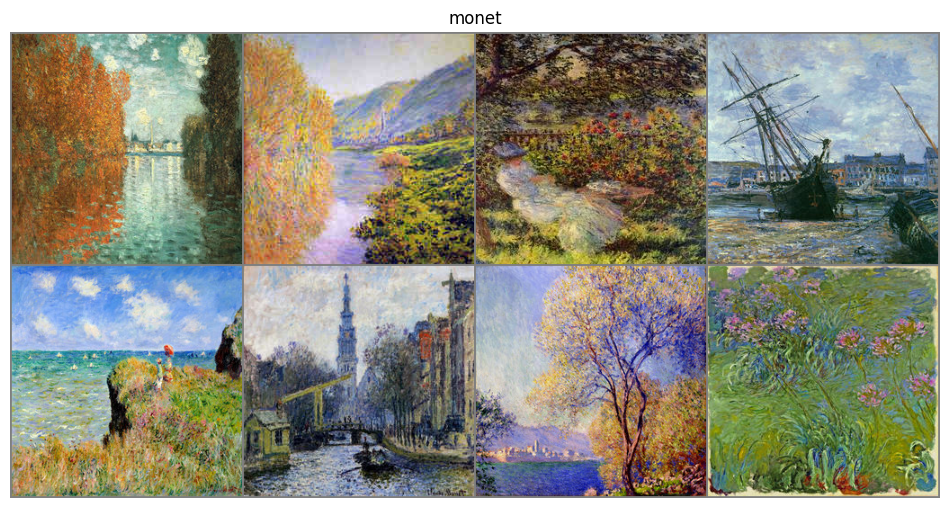

In [14]:
#Check dataset & dataloader results
dataiter = iter(test_dataloader_Y)
images_normalized = next(dataiter)
grid_normalized = make_grid(images_normalized, nrow=4).permute(1, 2, 0).detach().numpy()
grid_original = reverse_normalize(grid_normalized)
fig = plt.figure(figsize=(12, 8))
plt.imshow(grid_original)
plt.axis('off')
plt.title('monet')
plt.show()

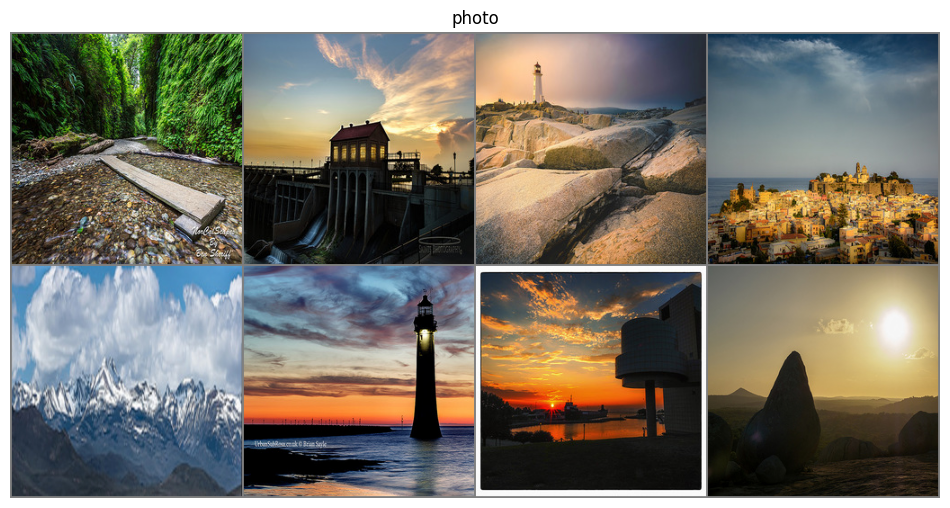

In [15]:
#Check dataset & dataloader results
dataiter = iter(test_dataloader_X)
images_normalized = next(dataiter)
grid_normalized = make_grid(images_normalized, nrow=4).permute(1, 2, 0).detach().numpy()
grid_original = reverse_normalize(grid_normalized)
fig = plt.figure(figsize=(12, 8))
plt.imshow(grid_original)
plt.axis('off')
plt.title('photo')
plt.show()

In [16]:
import torch.nn as nn
import torch.nn.functional as F

def conv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=False, instance_norm=False):

    #Add layers
    layers = []
    conv_layer = nn.Conv2d(in_channels=in_channels, out_channels=out_channels, kernel_size=kernel_size, stride=stride, padding=padding, bias=False)
    layers.append(conv_layer)

    #Batch normalization
    if batch_norm:
        layers.append(nn.BatchNorm2d(out_channels))

    #Instance normalization
    if instance_norm:
        layers.append(nn.InstanceNorm2d(out_channels))
    return nn.Sequential(*layers)

In [17]:
class Discriminator(nn.Module):

    def __init__(self, conv_dim=64):
        super(Discriminator, self).__init__()

        #convolutional layers, increasing in depth
        self.conv1 = conv(in_channels=3, out_channels=conv_dim, kernel_size=4)
        self.conv2 = conv(in_channels=conv_dim, out_channels=conv_dim*2, kernel_size=4, instance_norm=True)
        self.conv3 = conv(in_channels=conv_dim*2, out_channels=conv_dim*4, kernel_size=4, instance_norm=True)
        self.conv4 = conv(in_channels=conv_dim*4, out_channels=conv_dim*8, kernel_size=4, instance_norm=True)
        self.conv5 = conv(in_channels=conv_dim*8, out_channels=conv_dim*8, kernel_size=4, batch_norm=True)

        #final classification layer
        self.conv6 = conv(conv_dim*8, out_channels=1, kernel_size=4, stride=1)

    def forward(self, x):


        out = F.leaky_relu(self.conv1(x), negative_slope=0.2)
        out = F.leaky_relu(self.conv2(out), negative_slope=0.2)
        out = F.leaky_relu(self.conv3(out), negative_slope=0.2)
        out = F.leaky_relu(self.conv4(out), negative_slope=0.2)
        out = self.conv6(out)
        return out

In [18]:
class ResidualBlock(nn.Module):

    def __init__(self, conv_dim):
        super(ResidualBlock, self).__init__()
        self.conv1 = conv(in_channels=conv_dim, out_channels=conv_dim, kernel_size=3, stride=1, padding=1, instance_norm=True)
        self.conv2 = conv(in_channels=conv_dim, out_channels=conv_dim, kernel_size=3, stride=1, padding=1, instance_norm=True)

    def forward(self, x):
        out_1 = F.relu(self.conv1(x))
        out_2 = x + self.conv2(out_1)
        return out_2

In [19]:
def deconv(in_channels, out_channels, kernel_size, stride=2, padding=1, batch_norm=False, instance_norm=False, dropout=False, dropout_ratio=0.5):
    layers = []
    layers.append(nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False))

    if batch_norm:
        layers.append(nn.BatchNorm2d(out_channels))

    if instance_norm:
        layers.append(nn.InstanceNorm2d(out_channels))

    if dropout:
        layers.append(nn.Dropout2d(dropout_ratio))

    return nn.Sequential(*layers)



In [20]:
class CycleGenerator(nn.Module):

    def __init__(self, conv_dim=64, n_res_blocks=6):
        super(CycleGenerator, self).__init__()

        #Encoder layers
        self.conv1 = conv(in_channels=3, out_channels=conv_dim, kernel_size=4)
        self.conv2 = conv(in_channels=conv_dim, out_channels=conv_dim*2, kernel_size=4, instance_norm=True)
        self.conv3 = conv(in_channels=conv_dim*2, out_channels=conv_dim*4, kernel_size=4, instance_norm=True)

        # Residual Layer
        res_layers = []
        for layer in range(n_res_blocks):
            res_layers.append(ResidualBlock(conv_dim*4))
        self.res_blocks = nn.Sequential(*res_layers)

        # Decoder Layer
        self.deconv4 = deconv(in_channels=conv_dim*4, out_channels=conv_dim*2, kernel_size=4, instance_norm=True)
        self.deconv5 = deconv(in_channels=conv_dim*2, out_channels=conv_dim, kernel_size=4, instance_norm=True)
        self.deconv6 = deconv(in_channels=conv_dim, out_channels=3, kernel_size=4, instance_norm=True)

    def forward(self, x):


        out = F.leaky_relu(self.conv1(x), negative_slope=0.2)
        out = F.leaky_relu(self.conv2(out), negative_slope=0.2)
        out = F.leaky_relu(self.conv3(out), negative_slope=0.2)


        out = self.res_blocks(out)


        out = F.leaky_relu(self.deconv4(out), negative_slope=0.2)
        out = F.leaky_relu(self.deconv5(out), negative_slope=0.2)
        out = torch.tanh(self.deconv6(out))

        return out

In [21]:
from torch.nn import init
def weights_init_normal(m):
    classname = m.__class__.__name__

    #normal distribution with given paramters
    std_dev = 0.02
    mean = 0.0

    # Initialize conv layer
    if hasattr(m, 'weight') and (classname.find('Conv') != -1):
        init.normal_(m.weight.data, mean, std_dev)


In [22]:
def build_model(g_conv_dim=64, d_conv_dim=64, n_res_blocks=6):

    #Generators
    G_XtoY = CycleGenerator(conv_dim=g_conv_dim, n_res_blocks=n_res_blocks)
    G_YtoX = CycleGenerator(conv_dim=g_conv_dim, n_res_blocks=n_res_blocks)

    #Discriminators
    D_X = Discriminator(conv_dim=d_conv_dim) # Y-->X
    D_Y = Discriminator(conv_dim=d_conv_dim) # X-->Y

    #Weight initialization
    G_XtoY.apply(weights_init_normal)
    G_YtoX.apply(weights_init_normal)
    D_X.apply(weights_init_normal)
    D_Y.apply(weights_init_normal)

    #Moves models to GPU, if available
    if torch.cuda.is_available():
        device = torch.device("cuda:0")
        G_XtoY.to(device)
        G_YtoX.to(device)
        D_X.to(device)
        D_Y.to(device)
        print('Models moved to GPU.')
    else:
        print('Only CPU available.')

    return G_XtoY, G_YtoX, D_X, D_Y


In [23]:
G_XtoY, G_YtoX, D_X, D_Y = build_model()

Models moved to GPU.


In [24]:
summary(G_XtoY, input_size = (3, 256, 256), batch_size = -1)


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           3,072
            Conv2d-2          [-1, 128, 64, 64]         131,072
    InstanceNorm2d-3          [-1, 128, 64, 64]               0
            Conv2d-4          [-1, 256, 32, 32]         524,288
    InstanceNorm2d-5          [-1, 256, 32, 32]               0
            Conv2d-6          [-1, 256, 32, 32]         589,824
    InstanceNorm2d-7          [-1, 256, 32, 32]               0
            Conv2d-8          [-1, 256, 32, 32]         589,824
    InstanceNorm2d-9          [-1, 256, 32, 32]               0
    ResidualBlock-10          [-1, 256, 32, 32]               0
           Conv2d-11          [-1, 256, 32, 32]         589,824
   InstanceNorm2d-12          [-1, 256, 32, 32]               0
           Conv2d-13          [-1, 256, 32, 32]         589,824
   InstanceNorm2d-14          [-1, 256,

In [25]:
summary(D_X, input_size = (3, 256, 256), batch_size = -1)

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 128, 128]           3,072
            Conv2d-2          [-1, 128, 64, 64]         131,072
    InstanceNorm2d-3          [-1, 128, 64, 64]               0
            Conv2d-4          [-1, 256, 32, 32]         524,288
    InstanceNorm2d-5          [-1, 256, 32, 32]               0
            Conv2d-6          [-1, 512, 16, 16]       2,097,152
    InstanceNorm2d-7          [-1, 512, 16, 16]               0
            Conv2d-8            [-1, 1, 15, 15]           8,192
Total params: 2,763,776
Trainable params: 2,763,776
Non-trainable params: 0
----------------------------------------------------------------
Input size (MB): 0.75
Forward/backward pass size (MB): 22.00
Params size (MB): 10.54
Estimated Total Size (MB): 33.29
----------------------------------------------------------------


In [26]:
def print_build(G_XtoY, G_YtoX, D_X, D_Y):
    print("                     G_XtoY                    ")
    print("-----------------------------------------------")
    print(G_XtoY)
    print()

    print("                     G_YtoX                    ")
    print("-----------------------------------------------")
    print(G_YtoX)
    print()

    print("                      D_X                      ")
    print("-----------------------------------------------")
    print(D_X)
    print()

    print("                      D_Y                      ")
    print("-----------------------------------------------")
    print(D_Y)
    print()

print_build(G_XtoY, G_YtoX, D_X, D_Y)



                     G_XtoY                    
-----------------------------------------------
CycleGenerator(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
  )
  (conv3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
  )
  (res_blocks): Sequential(
    (0): ResidualBlock(
      (conv1): Sequential(
        (0): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      )
      (conv2): Sequential(
        (0): Conv2d(256, 256, kernel_size=(3, 3)

In [27]:
def real_mse_loss(D_out, adverserial_weight=1):
    mse_loss = torch.mean((D_out-1)**2)*adverserial_weight
    return mse_loss

def fake_mse_loss(D_out, adverserial_weight=1):
    mse_loss = torch.mean(D_out**2)*adverserial_weight
    return mse_loss

def cycle_consistency_loss(real_img, reconstructed_img, lambda_weight=1):
    reconstr_loss = torch.mean(torch.abs(real_img - reconstructed_img))
    return lambda_weight*reconstr_loss

def identity_loss(real_img, generated_img, identity_weight=1):
    ident_loss = torch.mean(torch.abs(real_img - generated_img))
    return identity_weight*ident_loss

In [28]:

import torch.optim as optim

#hyperparameter
lr=0.0002
beta1=0.500
beta2=0.999
g_params = list(G_XtoY.parameters()) + list(G_YtoX.parameters())

#Optimizers for generator and discriminator
g_optimizer = optim.Adam(g_params, lr, [beta1, beta2])
d_x_optimizer = optim.Adam(D_X.parameters(), lr, [beta1, beta2])
d_y_optimizer = optim.Adam(D_Y.parameters(), lr, [beta1, beta2])



In [29]:

def calculate_accuracy(predictions, targets):
    predicted_labels = (predictions > 0.5).float()
    correct = (predicted_labels == targets).float().sum()
    accuracy = correct / targets.numel()
    return accuracy.item()

def training_loop(dataloader_X, dataloader_Y, test_dataloader_X, test_dataloader_Y, n_epochs=1000):

    # Losses and accuracies over time
    losses = []
    accuracies = []

    # Additional weighting parameters
    adverserial_weight = 0.5
    lambda_weight = 10
    identity_weight = 5

    # Get some fixed data from domains X and Y for sampling. Images are held constant throughout training and allow us to inspect the model's performance.
    test_iter_X = iter(test_dataloader_X)
    test_iter_Y = iter(test_dataloader_Y)
    fixed_X = next(test_iter_X)
    fixed_Y = next(test_iter_Y)

    # Batches per epoch
    iter_X = iter(dataloader_X)
    iter_Y = iter(dataloader_Y)
    batches_per_epoch = min(len(iter_X), len(iter_Y))

    # Average loss and accuracy over batches per epoch runs
    d_total_loss_avg = 0.0
    g_total_loss_avg = 0.0
    d_accuracy_avg = 0.0
    g_accuracy_avg = 0.0

    # Loop through epochs
    for epoch in range(1, n_epochs+1):

        # Reset iterators for each epoch
        if epoch % batches_per_epoch == 0:
            iter_X = iter(dataloader_X)
            iter_Y = iter(dataloader_Y)

        # Get images from domain X
        images_X = next(iter_X)

        # Get images from domain Y
        images_Y = next(iter_Y)

        # Move images to GPU if available (otherwise stay on CPU)
        device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        images_X = images_X.to(device)
        images_Y = images_Y.to(device)

        # Discriminator D_X
        d_x_optimizer.zero_grad()

        # Compute the discriminator losses on real images
        out_x_real = D_X(images_X)
        D_X_real_loss = real_mse_loss(out_x_real, adverserial_weight)
        D_X_real_accuracy = calculate_accuracy(out_x_real, torch.ones_like(out_x_real))

        # Generate fake images that look like domain X based on real images in domain Y
        fake_X = G_YtoX(images_Y)

        # Compute the fake loss for D_X
        out_x_fake = D_X(fake_X)
        D_X_fake_loss = fake_mse_loss(out_x_fake, adverserial_weight)
        D_X_fake_accuracy = calculate_accuracy(out_x_fake, torch.zeros_like(out_x_fake))

        # Compute the total loss and perform backpropagation
        d_x_loss = D_X_real_loss + D_X_fake_loss
        d_x_loss.backward()
        d_x_optimizer.step()

        # Compute the average accuracy for D_X
        d_x_accuracy = (D_X_real_accuracy + D_X_fake_accuracy) / 2

        # Discriminator D_Y
        d_y_optimizer.zero_grad()

        # Compute the discriminator losses on real images
        out_y_real = D_Y(images_Y)
        D_Y_real_loss = real_mse_loss(out_y_real, adverserial_weight)
        D_Y_real_accuracy = calculate_accuracy(out_y_real, torch.ones_like(out_y_real))

        # Generate fake images that look like domain Y based on real images in domain X
        fake_Y = G_XtoY(images_X)

        # Compute the fake loss for D_Y
        out_y_fake = D_Y(fake_Y)
        D_Y_fake_loss = fake_mse_loss(out_y_fake, adverserial_weight)
        D_Y_fake_accuracy = calculate_accuracy(out_y_fake, torch.zeros_like(out_y_fake))

        # Compute the total loss and perform backprop
        d_y_loss = D_Y_real_loss + D_Y_fake_loss
        d_y_loss.backward()
        d_y_optimizer.step()

        # Compute total discriminator loss
        d_total_loss = D_X_real_loss + D_X_fake_loss + D_Y_real_loss + D_Y_fake_loss

        # Compute the average accuracy for D_Y
        d_y_accuracy = (D_Y_real_accuracy + D_Y_fake_accuracy) / 2

        # Average discriminator accuracy
        d_accuracy = (d_x_accuracy + d_y_accuracy) / 2

        # Generator
        g_optimizer.zero_grad()

        # Generate fake images that look like domain X based on real images in domain Y
        fake_X = G_YtoX(images_Y)

        # Compute the generator loss based on domain X
        out_x = D_X(fake_X)
        g_YtoX_loss = real_mse_loss(out_x, adverserial_weight)

        # Create a reconstructed Y
        reconstructed_Y = G_XtoY(fake_X)

        # Compute the cycle consistency loss (the reconstruction loss)
        reconstructed_y_loss = cycle_consistency_loss(images_Y, reconstructed_Y, lambda_weight=lambda_weight)

        # Compute the identity loss from transformation Y-->X
        identity_y_loss = identity_loss(images_Y, fake_X, identity_weight=identity_weight)

        # Generate fake images that look like domain Y based on real images in domain X
        fake_Y = G_XtoY(images_X)

        # Compute the generator loss based on domain Y
        out_y = D_Y(fake_Y)
        g_XtoY_loss = real_mse_loss(out_y, adverserial_weight)

        # Create a reconstructed X
        reconstructed_X = G_YtoX(fake_Y)

        # Compute the cycle consistency loss (the reconstruction loss)
        reconstructed_x_loss = cycle_consistency_loss(images_X, reconstructed_X, lambda_weight=lambda_weight)

        # Compute the identity loss from transformation X-->Y
        identity_x_loss = identity_loss(images_X, fake_Y, identity_weight=identity_weight)

        # Add up all generator and reconstructed losses and perform backprop
        g_total_loss = g_YtoX_loss + g_XtoY_loss + reconstructed_y_loss + reconstructed_x_loss + identity_y_loss + identity_x_loss
        g_total_loss.backward()
        g_optimizer.step()

        # Average loss
        d_total_loss_avg += d_total_loss / batches_per_epoch
        g_total_loss_avg += g_total_loss / batches_per_epoch

        # Average accuracy
        d_accuracy_avg += d_accuracy / batches_per_epoch
        g_accuracy_avg += (calculate_accuracy(out_x, torch.ones_like(out_x)) + calculate_accuracy(out_y, torch.ones_like(out_y))) / 2 / batches_per_epoch

        print_every = batches_per_epoch
        if epoch % print_every == 0:
            losses.append((d_total_loss_avg.item(), g_total_loss_avg.item()))
            accuracies.append((d_accuracy_avg, g_accuracy_avg))
            true_epoch_n = int(epoch / batches_per_epoch)
            true_epoch_total = int(n_epochs / batches_per_epoch)
            print('Epoch [{:5d}/{:5d}] | d_total_loss_avg: {:6.4f} | g_total_loss_avg: {:6.4f} | d_accuracy_avg: {:6.4f} | g_accuracy_avg: {:6.4f}'.format(
                true_epoch_n, true_epoch_total, d_total_loss_avg.item(), g_total_loss_avg.item(), d_accuracy_avg, g_accuracy_avg))

            # Reset average loss and accuracy for each epoch
            d_total_loss_avg = 0.0
            g_total_loss_avg = 0.0
            d_accuracy_avg = 0.0
            g_accuracy_avg = 0.0

        # Save the model parameters
        checkpoint_every = 3000
        if epoch % checkpoint_every == 0:
            save_checkpoint(epoch, G_XtoY, G_YtoX, D_X, D_Y)

    return losses, accuracies



In [30]:

batches_per_epoch = min(len(dataloader_X), len(dataloader_Y))
epoch_true = 50

In [31]:
n_epochs = epoch_true * batches_per_epoch
losses, accuracies = training_loop(dataloader_X, dataloader_Y, test_dataloader_X, test_dataloader_Y, n_epochs=n_epochs)


Epoch [    1/   50] | d_total_loss_avg: 1.7645 | g_total_loss_avg: 12.6756 | d_accuracy_avg: 0.5627 | g_accuracy_avg: 0.3987
Epoch [    2/   50] | d_total_loss_avg: 0.5455 | g_total_loss_avg: 9.3084 | d_accuracy_avg: 0.6298 | g_accuracy_avg: 0.3280
Epoch [    3/   50] | d_total_loss_avg: 0.4350 | g_total_loss_avg: 8.6539 | d_accuracy_avg: 0.6983 | g_accuracy_avg: 0.2494
Epoch [    4/   50] | d_total_loss_avg: 0.4014 | g_total_loss_avg: 8.3130 | d_accuracy_avg: 0.7346 | g_accuracy_avg: 0.2123
Epoch [    5/   50] | d_total_loss_avg: 0.3992 | g_total_loss_avg: 7.8749 | d_accuracy_avg: 0.7393 | g_accuracy_avg: 0.2101
Epoch [    6/   50] | d_total_loss_avg: 0.3472 | g_total_loss_avg: 7.8505 | d_accuracy_avg: 0.7694 | g_accuracy_avg: 0.1728
Epoch [    7/   50] | d_total_loss_avg: 0.3349 | g_total_loss_avg: 7.8510 | d_accuracy_avg: 0.7881 | g_accuracy_avg: 0.1606
Epoch [    8/   50] | d_total_loss_avg: 0.3218 | g_total_loss_avg: 7.6680 | d_accuracy_avg: 0.7948 | g_accuracy_avg: 0.1499
Epoch [

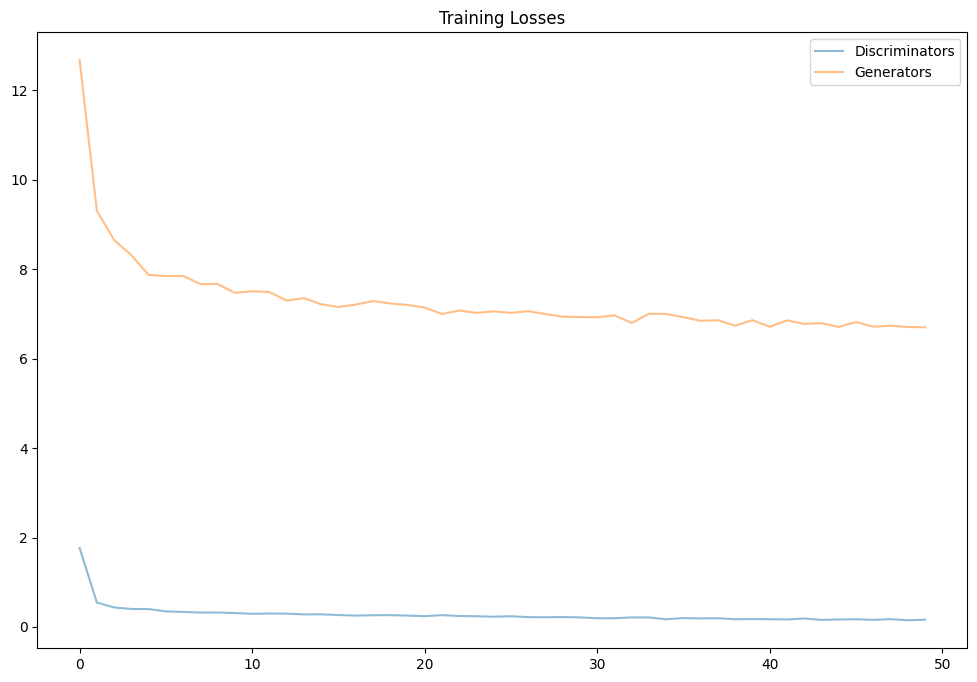

In [32]:

#Plot loss functions over training
fig, ax = plt.subplots(figsize=(12,8))
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminators', alpha=0.5)
plt.plot(losses.T[1], label='Generators', alpha=0.5)
plt.title("Training Losses")
plt.legend()
plt.show()

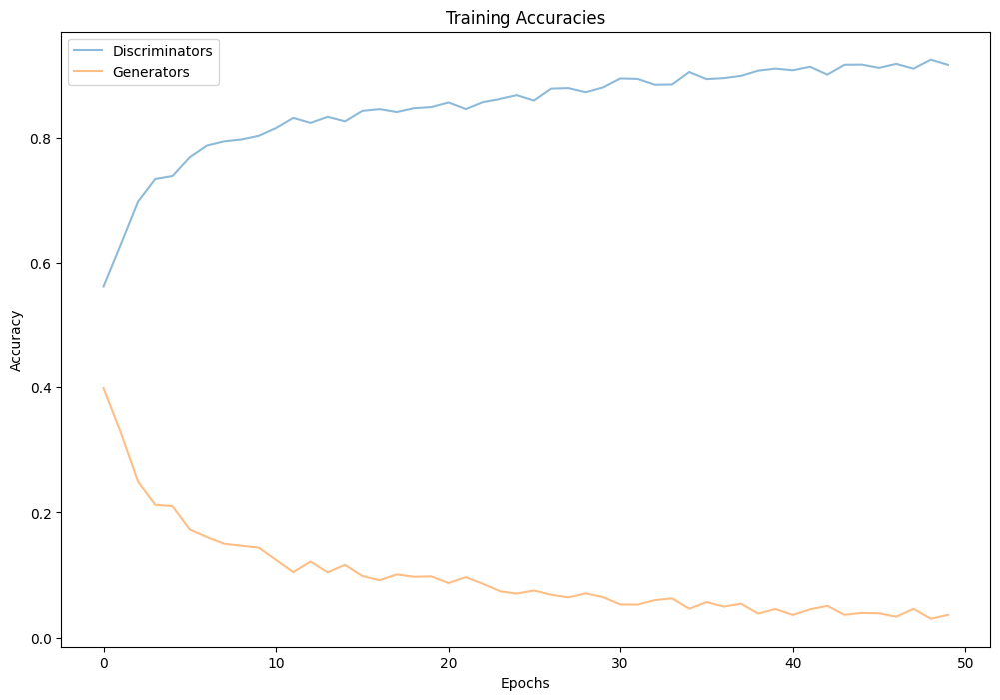

In [33]:
# Convert the accuracies list to a numpy array for easy indexing and plotting
accuracies = np.array(accuracies)

# Create a new figure for the accuracy plots
fig, ax = plt.subplots(figsize=(12,8))

# Plot the discriminator and generator accuracies
plt.plot(accuracies.T[0], label='Discriminators', alpha=0.5)
plt.plot(accuracies.T[1], label='Generators', alpha=0.5)

# Add titles and labels
plt.title("Training Accuracies")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

# Show the plot
plt.show()


In [34]:

#Get some fixed data from domains X and Y for sampling. These are images that are held constant throughout training, that allow us to inspect the model's performance.
test_iter_X = iter(test_dataloader_X)
test_iter_Y = iter(test_dataloader_Y)



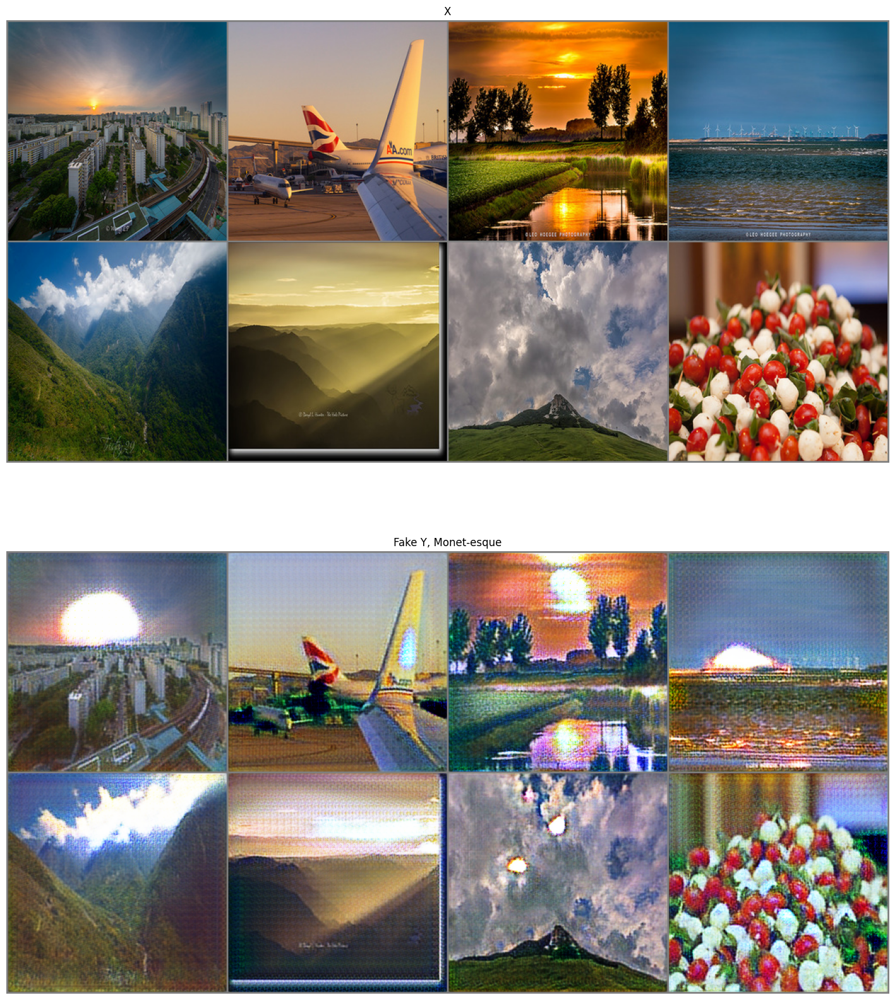

In [35]:
#Sample
fixed_X = next(test_iter_X)
fixed_X = next(test_iter_X)
fixed_X = next(test_iter_X)

#Evaluation
G_XtoY.eval()

mean_=0.5
std_=0.5

#Identify correct device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

#Create fake pictures for both cycles
fake_Y = G_XtoY(fixed_X.to(device))

#Generate grids
grid_x =  make_grid(fixed_X, nrow=4).permute(1, 2, 0).detach().cpu().numpy()
grid_fake_y =  make_grid(fake_Y, nrow=4).permute(1, 2, 0).detach().cpu().numpy()

#Normalize pictures to pixel range rom 0 to 255
X, fake_Y_ = reverse_normalize(grid_x, mean_, std_), reverse_normalize(grid_fake_y, mean_, std_)

#Transformation from X -> Y
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, sharey=True, figsize=(30, 20))
ax1.imshow(X)
ax1.axis('off')
ax1.set_title('X')
ax2.imshow(fake_Y_)
ax2.axis('off')
ax2.set_title('Fake Y, Monet-esque')
plt.show()

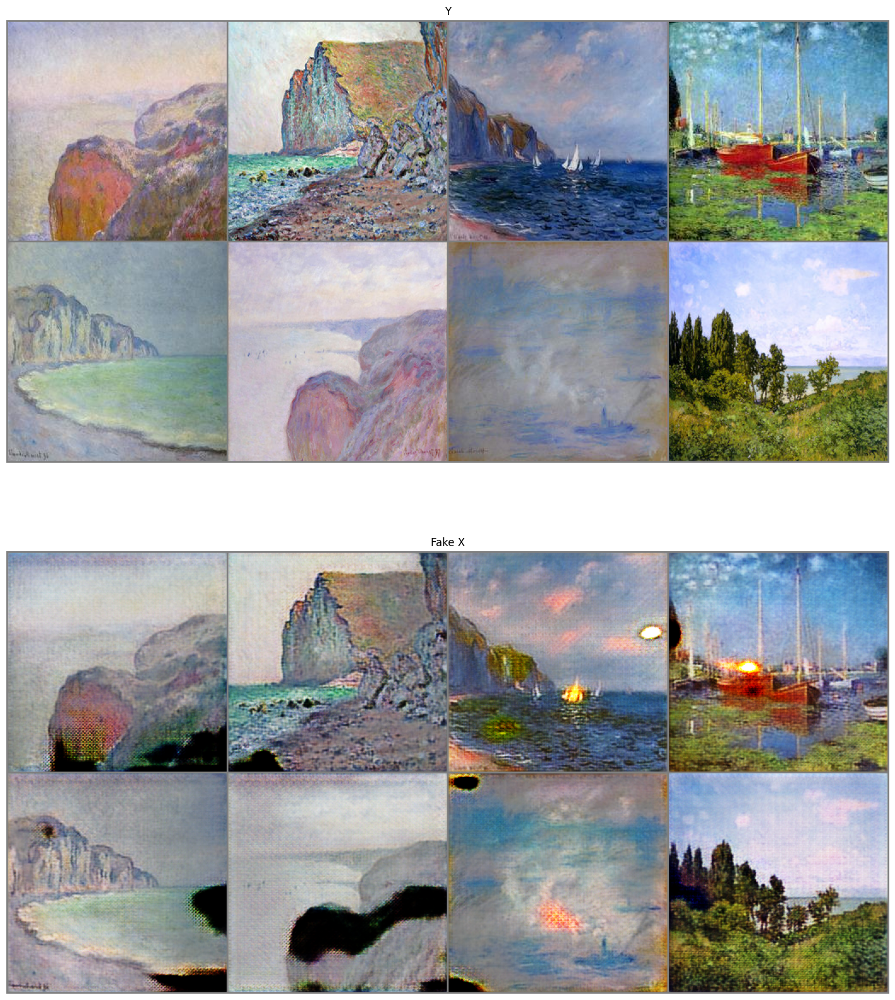

In [36]:
#Sample
fixed_Y = next(test_iter_Y)
fixed_Y = next(test_iter_Y)
fixed_Y = next(test_iter_Y)

#Evaluation
G_YtoX.eval()

mean_=0.5
std_=0.5

#Identify correct device
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

#Create fake pictures for both cycles
fake_X = G_YtoX(fixed_Y.to(device))

#Generate grids
grid_y =  make_grid(fixed_Y, nrow=4).permute(1, 2, 0).detach().cpu().numpy()
grid_fake_x =  make_grid(fake_X, nrow=4).permute(1, 2, 0).detach().cpu().numpy()

#Normalize pictures to pixel range rom 0 to 255
Y, fake_X_ = reverse_normalize(grid_y, mean_, std_), reverse_normalize(grid_fake_x, mean_, std_)

#Transformation from Y -> X
fig, (ax1, ax2) = plt.subplots(2, 1, sharex=True, sharey=True, figsize=(30, 20))
ax1.imshow(Y)
ax1.axis('off')
ax1.set_title('Y')
ax2.imshow(fake_X_)
ax2.axis('off')
ax2.set_title('Fake X')
plt.show()

In [37]:
!mkdir /content/images

In [38]:
#Set model to evaluation
G_XtoY.eval()

#Get data loader for final transformation / submission
submit_dataloader = DataLoader(dataset_photo, batch_size=1, shuffle=False, pin_memory=True)
dataiter = iter(submit_dataloader)

#Previous normalization choosen
mean_=0.5
std_=0.5

#Loop through each picture
for image_idx in range(0, len(submit_dataloader)):

    #Get base picture
    fixed_X = next(dataiter)

    #Identify correct device
    device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    #Create fake pictures (monet-esque)
    fake_Y = G_XtoY(fixed_X.to(device))
    fake_Y = fake_Y.detach().cpu().numpy()
    fake_Y = reverse_normalize(fake_Y, mean_, std_)
    fake_Y = fake_Y[0].transpose(1, 2, 0)
    fake_Y = np.uint8(fake_Y)
    fake_Y = Image.fromarray(fake_Y)
    #print(fake_Y.shape)

    #Save picture
    fake_Y.save("/content/images/" + str(image_idx) + ".jpg")

#Back to it
G_XtoY.train()

CycleGenerator(
  (conv1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  )
  (conv2): Sequential(
    (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
  )
  (conv3): Sequential(
    (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
  )
  (res_blocks): Sequential(
    (0): ResidualBlock(
      (conv1): Sequential(
        (0): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
      )
      (conv2): Sequential(
        (0): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
        (1): InstanceNorm2d(256, eps=1e-05, momentu

In [39]:
# 1. CLI Input Function (from search result [1])
import os
from PIL import Image

def get_user_image_path():
    image_path = input("Enter the path to your image: ")
    if not os.path.isfile(image_path):
        raise FileNotFoundError(f"File {image_path} not found")
    return image_path

# 2. Image Preprocessing (from search result [3] with torchvision fix)
import torchvision.transforms as transforms

def preprocess_user_image(image_path, image_size=256):
    transform = transforms.Compose([
        transforms.Resize((image_size, image_size)),
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ])
    return transform(Image.open(image_path).convert('RGB')).unsqueeze(0)

# 3. Model Inference (adapted from search result [4])
def run_inference(model, input_tensor):
    model.eval()
    with torch.no_grad():
        return model(input_tensor)

# 4. Output Handling (from search result [7] with torchvision fix)
def display_or_save_output(output_tensor, save_path=None):
    reverse_transform = transforms.Compose([
        transforms.Normalize(mean=[0., 0., 0.], std=[2, 2, 2]),
        transforms.Normalize(mean=[-0.5, -0.5, -0.5], std=[1, 1, 1]),
        transforms.ToPILImage()
    ])
    result = reverse_transform(output_tensor.squeeze(0).cpu())

    if save_path:
        result.save(save_path)
        print(f"Saved to {save_path}")
    else:
        plt.imshow(result)
        plt.axis('off')
        plt.show()


In [40]:
# Load pretrained generators (ensure you have these checkpoints)
G_photo_to_monet = load_checkpoint('G_XtoY.pkl')  # From original code

# Interactive workflow
try:
    # Get user input
    img_path = get_user_image_path()

    # Process image
    input_tensor = preprocess_user_image(img_path).to(device)

    # Generate output
    output_tensor = run_inference(G_photo_to_monet, input_tensor)

    # Show/save result
    display_or_save_output(output_tensor)

except Exception as e:
    print(f"Error: {str(e)}")


 [*] Loading checkpoint from G_XtoY.pkl succeed!
Enter the path to your image: /content/IST1.jpg
Error: 'collections.OrderedDict' object has no attribute 'eval'


In [46]:
pip install tensorflow opencv-python matplotlib


In [61]:
import tensorflow as tf
import cv2
import numpy as np
import os
import torch
from PIL import Image
import torchvision.transforms as transforms

# Assuming CycleGenerator, reverse_normalize, and preprocess_user_image are defined in your previous cells.
# If not, please provide their definitions here.

def convert_to_monet(input_path, output_path):
    # 1. Create an instance of the generator
    generator = CycleGenerator()

    # 2. Load the state dictionary into the generator instance
    generator.load_state_dict(torch.load('G_XtoY.pkl', map_location=torch.device('cpu')))

    # 3. Preprocess the input image
    input_tensor = preprocess_user_image(input_path).to(torch.device('cpu'))  # Assuming preprocess_user_image is defined

    # 4. Generate the Monet-style image
    generator.eval()
    with torch.no_grad():
        output_tensor = generator(input_tensor)

    # 5. Post-process the output
    output_image = reverse_normalize(output_tensor.cpu().numpy()[0]) # Assuming reverse_normalize is defined
    output_image = np.transpose(output_image, (1, 2, 0))
    output_image = np.clip(output_image, 0, 255).astype(np.uint8)

    # 6. Save the output image
    Image.fromarray(output_image).save(output_path)
    print(f"Image saved to: {output_path}")

# Example usage
convert_to_monet('/content/IST3.jpg', 'monet_output.jpg')

Image saved to: monet_output.jpg
